In [1]:
%load_ext nb_black
import itertools
import cv2
from matplotlib import pyplot as plt
import numpy as np
import math
import pandas as pd
from numpy import linalg as LA
from skimage.morphology import skeletonize
from skimage import data
from skimage.util import invert
import math
from scipy.signal import find_peaks

<IPython.core.display.Javascript object>

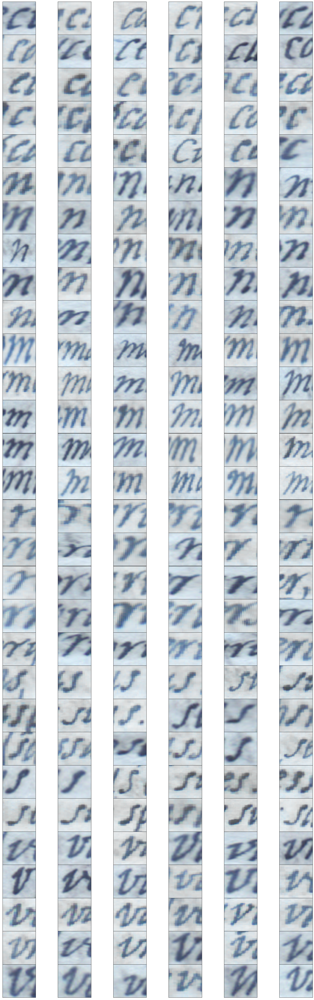

<IPython.core.display.Javascript object>

In [2]:
def originales(letra):
    originales = []
    for i in range(1, 31):
        img = cv2.imread("Letras/" + letra + str(i) + ".png")
        filas, columnas = img.shape[:2]
        y = float(210 / filas)
        x = float(210 / columnas)
        img = cv2.resize(img, None, fx=x, fy=y, interpolation=cv2.INTER_CUBIC)
        originales.append(img)
    return originales


c_original = originales("c")
n_original = originales("n")
m_original = originales("m")
r_original = originales("r")
s_original = originales("s")
v_original = originales("v")

imagenes = [c_original, n_original, m_original, r_original, s_original, v_original]
imagenes = list(itertools.chain.from_iterable(imagenes))
plt.figure(figsize=(20, 20))
for i in range(180):
    plt.subplot(30, 6, i + 1), plt.imshow(imagenes[i], cmap=plt.cm.gray)
    plt.xticks([]), plt.yticks([])
plt.subplots_adjust(top=3, bottom=0.01, left=0.01, right=1, hspace=0.001, wspace=0.05)
plt.show()

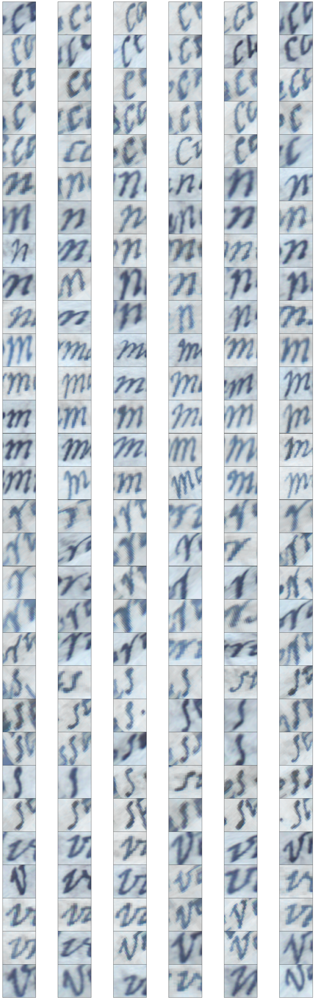

<IPython.core.display.Javascript object>

In [3]:
def slant(letras):
    slant = []
    for i in range(30):
        filas, columnas = letras[i].shape[:2]
        y = float(100 / filas)
        x = float(100 / columnas)
        img = cv2.resize(letras[i], None, fx=x, fy=y, interpolation=cv2.INTER_LINEAR)

        # Filtro de ruido y binarizacion
        # img = cv2.medianBlur(img,3)
        filas, columnas = img.shape[:2]
        gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        ret, thresh = cv2.threshold(
            gris, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
        )
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
        closing = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
        bordes = cv2.Canny(closing, 100, 200)
        (contornos, _) = cv2.findContours(
            bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        area = []
        for j in range(0, len(contornos)):
            cnt = contornos[j]
            area.append(cv2.contourArea(cnt))
        cotorno_letra = area.index(np.max(area))
        cnt1 = contornos[cotorno_letra]
        rect = cv2.minAreaRect(cnt1)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        angle = rect[-1]
        if angle < -45:
            angle = 90 + angle
        else:
            angle = -angle
        filas, columnas = thresh.shape
        M = cv2.getRotationMatrix2D((columnas / 2, filas / 2), angle, 1)
        rotadas = cv2.warpAffine(
            img, M, (columnas, filas), borderMode=cv2.BORDER_REPLICATE
        )
        slant.append(rotadas)
    return slant


cslant = slant(c_original)
nslant = slant(n_original)
mslant = slant(m_original)
rslant = slant(r_original)
sslant = slant(s_original)
vslant = slant(v_original)

imagenes = [cslant, nslant, mslant, rslant, sslant, vslant]
imagenes = list(itertools.chain.from_iterable(imagenes))
plt.figure(figsize=(20, 20))
for i in range(180):
    plt.subplot(30, 6, i + 1), plt.imshow(imagenes[i], cmap=plt.cm.gray)
    plt.xticks([]), plt.yticks([])
plt.subplots_adjust(top=3, bottom=0.01, left=0.01, right=1, hspace=0.001, wspace=0.05)
plt.show()

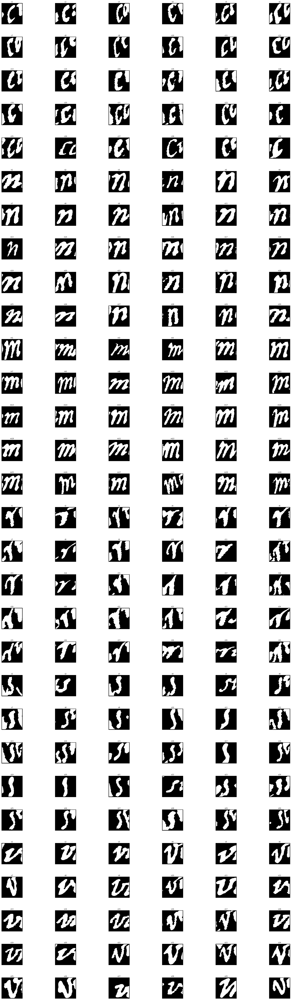

<IPython.core.display.Javascript object>

In [4]:
def kmean_bin(letra, valor_umbral):
    binarizadas = []
    for i in range(30):
        img = letra[i]
        vectorized = img.reshape((-1, 3))
        vectorized = np.float32(vectorized)
        criteria = (cv2.TERM_CRITERIA_EPS, 20, 0.5)
        K = 6
        attempts = 20
        ret, label, center = cv2.kmeans(
            vectorized, K, None, criteria, attempts, cv2.KMEANS_PP_CENTERS
        )
        center = np.uint8(center)
        res = center[label.flatten()]
        result_image = res.reshape((img.shape))

        # Convert to HSV space
        HSV_img = cv2.cvtColor(result_image, cv2.COLOR_BGR2HSV)
        h, s, v = cv2.split(HSV_img)
        # hue = HSV_img[:, :, 0]

        # select maximum value of H component from histogram
        hist = cv2.calcHist([s], [0], None, [256], [0, 256])
        hist = hist[1:, :]  # suppress black value

        indices = find_peaks(hist[:, 0])[0]
        th, threshed2 = cv2.threshold(
            cv2.medianBlur(s, 3), np.mean(indices) - 7, 255, cv2.THRESH_BINARY
        )
        img = threshed2.copy()
        for i in range(img.shape[0]):
            img[i, 0] = 0
            img[i, 1] = 0
            img[i, img.shape[1] - 1] = 0
            img[i, img.shape[1] - 2] = 0
        for i in range(img.shape[1]):
            img[0, i] = 0
            img[1, i] = 0
            img[img.shape[1] - 1, i] = 0
            img[img.shape[1] - 2, i] = 0
        binarizadas.append(img)
    return binarizadas


umbral = 175
c_kbin = kmean_bin(cslant, umbral)
n_kbin = kmean_bin(nslant, umbral)
m_kbin = kmean_bin(mslant, umbral)
r_kbin = kmean_bin(rslant, umbral)
s_kbin = kmean_bin(sslant, umbral)
v_kbin = kmean_bin(vslant, umbral)

imagenes = [c_kbin, n_kbin, m_kbin, r_kbin, s_kbin, v_kbin]
imagenes = list(itertools.chain.from_iterable(imagenes))

titulos = ["c1"]
letras_map = "cnmrsv"
for i in range(0, 180):
    titulos.append(letras_map[math.floor(i / 30)] + str((i % 30) + 1))
titulos.append("v30")

plt.figure(figsize=(100, 100))
for i in range(180):
    plt.title(titulos[i])
    plt.subplot(30, 6, i + 1), plt.imshow(imagenes[i], cmap=plt.cm.gray)
    plt.xticks([]), plt.yticks([])
plt.subplots_adjust(
    top=1, bottom=0.01, left=0.01, right=0.33, hspace=0.6, wspace=0.00001
)
plt.savefig("kmean_bin2.png")
plt.show()

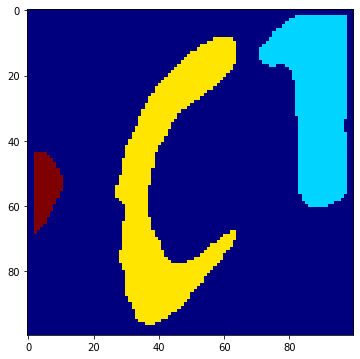

5 54
87 27
41 55
5 54
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


<IPython.core.display.Javascript object>

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

from skimage import data
from skimage.segmentation import clear_border
from skimage.morphology import label, closing, square
from skimage.measure import regionprops


bw = imagenes[0].copy()

# remove artifacts connected to image border
cleared = imagenes[0].copy()
clear_border(cleared)

# label image regions
label_image = label(cleared)
borders = np.logical_xor(bw, cleared)
label_image[borders] = -1

fig, ax = plt.subplots(ncols=1, nrows=1, figsize=(6, 6))
ax.imshow(label_image, cmap="jet")

plt.show()


area = []
for j in range(0, len(np.unique(label_image))):
    cnt = label_image == j
    bordes = cv2.Canny(np.uint8(255 * cnt), 100, 200)
    (contornos, _) = cv2.findContours(
        bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    perimetro = cv2.arcLength(contornos[0], True)
    area = cv2.contourArea(contornos[0])
    M = cv2.moments(contornos[0])
    centroide_x = int(M["m10"] / M["m00"])
    centroide_y = int(M["m01"] / M["m00"])
    if centroide_x > np.shape(label_image)[1] * 0.4 and centroide_x < (
        np.shape(label_image)[1] * 0.6
    ):
        cnt = contornos[0]
    print(centroide_x, centroide_y)
print(cnt)

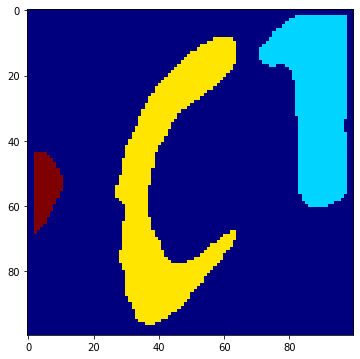

<IPython.core.display.Javascript object>

In [9]:
import ast
import numpy as np


def from_np_array(array_string):
    array_string = ",".join(array_string.replace("[ ", "[").split())
    return np.array(ast.literal_eval(array_string))


name_columns = [
    "Letra",
    "Area",
    "Perimetro",
    "m00",
    "m10",
    "m01",
    "m20",
    "m11",
    "m02",
    "m30",
    "m21",
    "m12",
    "m03",
    "mu20",
    "mu11",
    "mu02",
    "mu30",
    "mu21",
    "mu12",
    "mu03",
    "nu20",
    "nu11",
    "nu02",
    "nu30",
    "nu21",
    "nu12",
    "nu30",
    "Hu_M 1",
    "Hu_M 2",
    "Hu_M 3",
    "Hu_M 4",
    "Hu_M 5",
    "Hu_M 6",
    "Hu_M 7",
]
name_columns.extend(
    np.core.defchararray.add(
        "hog", [str(i).zfill(3) for i in range(0, np.shape(fd)[0])],
    )
)
df = pd.DataFrame(columns=name_columns)
for i in range(len(imagenes)):
    # Operaciones Morfologicas
    # kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    # closing = cv2.morphologyEx(imagenes[i], cv2.MORPH_OPEN, kernel)
    # Detector de bordes Canny
    bordes = cv2.Canny(np.uint8(imagenes[i]), 100, 200)
    # Encontrar contornos de la letra
    (contornos, _) = cv2.findContours(
        bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    area = []
    for j in range(0, len(contornos)):
        cnt = contornos[j]
        area.append(cv2.contourArea(cnt))
    contorno_letra = area.index(np.max(area))
    cnt = contornos[contorno_letra]
    perimetro = cv2.arcLength(cnt, True)
    area = cv2.contourArea(cnt)
    M = cv2.moments(cnt)
    centroide_x = int(M["m10"] / M["m00"])
    centroide_y = int(M["m01"] / M["m00"])
    suma = np.sum(cnt)
    huMoments = cv2.HuMoments(M)
    (cx, cy), radio = cv2.minEnclosingCircle(cnt)
    fd, hog_image = hog(
        imagenes[i],
        orientations=8,
        pixels_per_cell=(16, 16),
        cells_per_block=(1, 1),
        visualize=True,
    )
    if i < 30:
        letra = "c"
        num = 0
    elif i >= 30 and i < 60:
        letra = "n"
        num = -29
    elif i >= 60 and i < 90:
        letra = "m"
        num = -59
    elif i >= 90 and i < 120:
        letra = "r"
        num = -89
    elif i >= 120 and i < 150:
        letra = "s"
        num = -119
    elif i >= 150 and i < 180:
        letra = "v"
        num = -149
    row_data = [
        letra,
        area,
        perimetro,
        M["m00"],
        M["m10"],
        M["m01"],
        M["m20"],
        M["m11"],
        M["m02"],
        M["m30"],
        M["m21"],
        M["m12"],
        M["m03"],
        M["mu20"],
        M["mu11"],
        M["mu02"],
        M["mu30"],
        M["mu21"],
        M["mu12"],
        M["mu03"],
        M["nu20"],
        M["nu11"],
        M["nu02"],
        M["nu30"],
        M["nu21"],
        M["nu12"],
        M["nu30"],
        float(huMoments[0]),
        float(huMoments[1]),
        float(huMoments[2]),
        float(huMoments[3]),
        float(huMoments[4]),
        float(huMoments[5]),
        float(huMoments[6]),
    ]
    row_data.extend(fd)
    df.loc[i] = row_data

print(df)
df.to_csv("datos.csv")

df2 = pd.read_csv("datos.csv", index_col=0)
print(df2)

In [7]:
def contornos(thresh):
    conornos1 = []
    for i in range(30):
        # Operaciones Morfologicas
        # data = (255 * thresh[i]).astype(np.uint8)
        data = thresh[i].copy().astype(np.uint8)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (20, 3))
        cerrada = cv2.morphologyEx(data, cv2.MORPH_OPEN, kernel)

        # Detector de bordes Canny
        bordes = cv2.Canny(data, 100, 200)
        # Encontrar contornos de la letra
        (contornos, _) = cv2.findContours(
            bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        imgc = np.zeros((thresh[i].shape))
        area = []
        cotorno_letra = 0
        for j in range(0, len(contornos)):
            cnt = contornos[j]
            area.append(cv2.contourArea(cnt))
        for j in range(0, len(contornos)):
            cnt = contornos[j]
            x, y, w, h = cv2.boundingRect(cnt)
            # draw a green rectangle to visualize the bounding rect
            cv2.rectangle(imgc, (x, y), (x + w, y + h), (0, 255, 0), 2)
            if x < 40 and y < 30:
                if cv2.contourArea(cnt) == np.max(area):
                    cotorno_letra = j
                    break
                else:
                    cotorno_letra = j

        # cotorno_letra = area.index(np.max(perimetro))
        imgf = np.zeros(
            thresh[i].shape[:2]
        )  # create a single channel 200x200 pixel black image
        print(len(contornos))
        print(cotorno_letra)
        contornos_letra = np.array(contornos[cotorno_letra])
        cv2.fillPoly(imgf, pts=[contornos_letra], color=(255, 255, 255))
        cv2.drawContours(
            imgf, [max([contornos_letra], key=cv2.contourArea)], -1, 255, thickness=-1
        )
        threshf = cv2.threshold(imgf, 100, 255, cv2.THRESH_BINARY)[1]
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2, 2))
        dilated = cv2.dilate(threshf, kernel)
        (contornos, _) = cv2.findContours(
            np.uint8(dilated), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
        )
        imgf = np.zeros(
            data.shape[:2]
        )  # create a single channel 200x200 pixel black image
        imgc = np.zeros(
            data.shape[:2]
        )  # create a single channel 200x200 pixel black image
        cv2.fillPoly(imgf, pts=contornos[0], color=(255, 255, 255))
        cv2.drawContours(imgc, contornos[0], -1, (255, 255, 255), 1)
        cv2.drawContours(
            imgf, [max(contornos, key=cv2.contourArea)], -1, 255, thickness=-1
        )
        contornos1.append(cv2.threshold(imgf, 100, 255, cv2.THRESH_BINARY)[1])
    return contornos1


# cc = contornos(c_kbin)
# nc = contornos(n_kbin)
# mc = contornos(m_kbin)
# rc = contornos(r_kbin)
# sc = contornos(s_kbin)
# vc = contornos(v_kbin)

# imagenes = [cc, nc, mc, rc, sc, vc]
# imagenes = list(itertools.chain.from_iterable(imagenes))
# plt.figure(figsize=(100, 100))
# for i in range(180):
#     plt.title(titulos[i])
#     plt.subplot(30, 6, i + 1), plt.imshow(imagenes[i], cmap=plt.cm.gray)
#     plt.xticks([]), plt.yticks([])
# plt.subplots_adjust(
#     top=1, bottom=0.01, left=0.01, right=0.33, hspace=0.6, wspace=0.00001
# )
# plt.savefig("contornos_area.png")
# plt.show()

<IPython.core.display.Javascript object>

(288,)


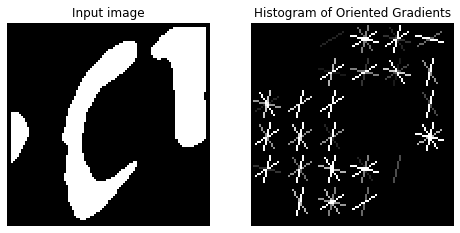

<IPython.core.display.Javascript object>

In [8]:
from skimage.feature import hog
from skimage import data, exposure

fd, hog_image = hog(
    imagenes[0],
    orientations=8,
    pixels_per_cell=(16, 16),
    cells_per_block=(1, 1),
    visualize=True,
)
print(np.shape(fd))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

ax1.axis("off")
ax1.imshow(imagenes[0], cmap=plt.cm.gray)
ax1.set_title("Input image")

# Rescale histogram for better display
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

ax2.axis("off")
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title("Histogram of Oriented Gradients")
plt.show()

# PCA

In [9]:
import ast
import numpy as np


def from_np_array(array_string):
    array_string = ",".join(array_string.replace("[ ", "[").split())
    return np.array(ast.literal_eval(array_string))


name_columns = [
    "Letra",
    "Area",
    "Perimetro",
    "m00",
    "m10",
    "m01",
    "m20",
    "m11",
    "m02",
    "m30",
    "m21",
    "m12",
    "m03",
    "mu20",
    "mu11",
    "mu02",
    "mu30",
    "mu21",
    "mu12",
    "mu03",
    "nu20",
    "nu11",
    "nu02",
    "nu30",
    "nu21",
    "nu12",
    "nu30",
    "Hu_M 1",
    "Hu_M 2",
    "Hu_M 3",
    "Hu_M 4",
    "Hu_M 5",
    "Hu_M 6",
    "Hu_M 7",
]
name_columns.extend(
    np.core.defchararray.add(
        "hog", [str(i).zfill(3) for i in range(0, np.shape(fd)[0])],
    )
)
df = pd.DataFrame(columns=name_columns)
for i in range(len(imagenes)):
    # Operaciones Morfologicas
    # kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    # closing = cv2.morphologyEx(imagenes[i], cv2.MORPH_OPEN, kernel)
    # Detector de bordes Canny
    bordes = cv2.Canny(np.uint8(imagenes[i]), 100, 200)
    # Encontrar contornos de la letra
    (contornos, _) = cv2.findContours(
        bordes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    area = []
    for j in range(0, len(contornos)):
        cnt = contornos[j]
        area.append(cv2.contourArea(cnt))
    contorno_letra = area.index(np.max(area))
    cnt = contornos[contorno_letra]
    perimetro = cv2.arcLength(cnt, True)
    area = cv2.contourArea(cnt)
    M = cv2.moments(cnt)
    centroide_x = int(M["m10"] / M["m00"])
    centroide_y = int(M["m01"] / M["m00"])
    suma = np.sum(cnt)
    huMoments = cv2.HuMoments(M)
    (cx, cy), radio = cv2.minEnclosingCircle(cnt)
    fd, hog_image = hog(
        imagenes[i],
        orientations=8,
        pixels_per_cell=(16, 16),
        cells_per_block=(1, 1),
        visualize=True,
    )
    if i < 30:
        letra = "c"
        num = 0
    elif i >= 30 and i < 60:
        letra = "n"
        num = -29
    elif i >= 60 and i < 90:
        letra = "m"
        num = -59
    elif i >= 90 and i < 120:
        letra = "r"
        num = -89
    elif i >= 120 and i < 150:
        letra = "s"
        num = -119
    elif i >= 150 and i < 180:
        letra = "v"
        num = -149
    row_data = [
        letra,
        area,
        perimetro,
        M["m00"],
        M["m10"],
        M["m01"],
        M["m20"],
        M["m11"],
        M["m02"],
        M["m30"],
        M["m21"],
        M["m12"],
        M["m03"],
        M["mu20"],
        M["mu11"],
        M["mu02"],
        M["mu30"],
        M["mu21"],
        M["mu12"],
        M["mu03"],
        M["nu20"],
        M["nu11"],
        M["nu02"],
        M["nu30"],
        M["nu21"],
        M["nu12"],
        M["nu30"],
        float(huMoments[0]),
        float(huMoments[1]),
        float(huMoments[2]),
        float(huMoments[3]),
        float(huMoments[4]),
        float(huMoments[5]),
        float(huMoments[6]),
    ]
    row_data.extend(fd)
    df.loc[i] = row_data

print(df)
df.to_csv("datos.csv")

df2 = pd.read_csv("datos.csv", index_col=0)
print(df2)

    Letra    Area    Perimetro     m00            m10            m01  \
0       c  1256.5   265.663994  1256.5   52628.333333   69112.666667   
1       c  1627.5   247.036578  1627.5   80171.833333   83311.500000   
2       c  1475.5   177.982755  1475.5  121503.833333   44602.666667   
3       c   842.5   138.669047   842.5   74017.166667   19237.333333   
4       c  1423.0   279.764500  1423.0   61192.000000   75413.166667   
..    ...     ...          ...     ...            ...            ...   
175     v    62.5  1053.678274    62.5    4148.500000    2612.666667   
176     v  2736.5   390.776691  2736.5  176791.666667  173914.333333   
177     v  1760.5   342.977701  1760.5   94299.000000   85336.000000   
178     v  4004.5   561.026475  4004.5  230564.166667  201608.000000   
179     v   587.5   115.355338   587.5   53122.500000   15183.166667   

              m20           m11           m02           m30  ...  hog278  \
0    2.314050e+06  2.776241e+06  4.684113e+06  1.066333e+08

<IPython.core.display.Javascript object>

In [10]:
features = [
    #     "Area",
    #     "Perimetro",
    #     "m00",
    #     "m10",
    #     "m01",
    #     "m20",
    #     "m11",
    #     "m02",
    #     "m30",
    #     "m21",
    #     "m12",
    #     "m03",
    #     "mu20",
    #     "mu11",
    #     "mu02",
    #     "mu30",
    #     "mu21",
    #     "mu12",
    #     "mu03",
    #     "nu20",
    #     "nu11",
    #     "nu02",
    #     "nu30",
    #     "nu21",
    #     "nu12",
    #     "nu30",
    "Hu_M 1",
    "Hu_M 2",
    "Hu_M 3",
    "Hu_M 4",
    "Hu_M 5",
    "Hu_M 6",
    "Hu_M 7",
]
features.extend(
    np.core.defchararray.add(
        "hog", [str(i).zfill(3) for i in range(0, np.shape(fd)[0])],
    )
)
print(len(features))
from sklearn.preprocessing import StandardScaler
from scipy.stats.mstats import zscore
from sklearn.decomposition import PCA

x = df.loc[:, features].values
x = StandardScaler().fit_transform(x)
# x.to_csv("x.csv")

y = df.loc[:, ["Letra"]].values

mean = np.empty((0))
mean, eigenvectors, eigenvalues = cv2.PCACompute2(x, mean)
pca = PCA(n_components=70)
principalComponents = pca.fit_transform(x)
print("variabilidad total = " + str(sum(pca.explained_variance_ratio_) * 100) + "%")
principalDf = pd.DataFrame(
    data=principalComponents,
    columns=[
        "principal component 1",
        "principal component 2",
        "principal component 3",
        "principal component 4",
        "principal component 5",
        "principal component 6",
        "principal component 7",
        "principal component 8",
        "principal component 9",
        "principal component 10",
        "principal component 11",
        "principal component 12",
        "principal component 13",
        "principal component 14",
        "principal component 15",
        "principal component 16",
        "principal component 17",
        "principal component 18",
        "principal component 19",
        "principal component 20",
        "principal component 21",
        "principal component 22",
        "principal component 23",
        "principal component 24",
        "principal component 25",
        "principal component 26",
        "principal component 27",
        "principal component 28",
        "principal component 29",
        "principal component 30",
        "principal component 31",
        "principal component 32",
        "principal component 33",
        "principal component 34",
        "principal component 35",
        "principal component 36",
        "principal component 37",
        "principal component 38",
        "principal component 39",
        "principal component 40",
        "principal component 41",
        "principal component 42",
        "principal component 43",
        "principal component 44",
        "principal component 45",
        "principal component 46",
        "principal component 47",
        "principal component 48",
        "principal component 49",
        "principal component 50",
        "principal component 51",
        "principal component 52",
        "principal component 53",
        "principal component 54",
        "principal component 55",
        "principal component 56",
        "principal component 57",
        "principal component 58",
        "principal component 59",
        "principal component 60",
        "principal component 61",
        "principal component 62",
        "principal component 63",
        "principal component 64",
        "principal component 65",
        "principal component 66",
        "principal component 67",
        "principal component 68",
        "principal component 69",
        "principal component 70",
    ],
)

finalDf = pd.concat([principalDf, df[["Letra"]]], axis=1)
finalDf.head(180)
# principalDf

295
variabilidad total = 92.32935182580145%


,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5,principal component 6,principal component 7,principal component 8,principal component 9,principal component 10,...,principal component 62,principal component 63,principal component 64,principal component 65,principal component 66,principal component 67,principal component 68,principal component 69,principal component 70,Letra
0,-3.903337,-0.233758,-3.041705,-1.344449,2.745840,3.267252,-2.671618,-0.589628,1.059511,0.109226,...,0.515033,0.796979,0.020062,0.708016,-0.789038,0.647137,-1.024493,0.133546,0.222431,c
1,-2.353456,0.593366,-2.283004,-0.125514,-0.647945,1.791468,-3.311091,1.604087,3.575306,-1.164296,...,0.113534,-0.618204,-0.674239,0.661181,-0.452242,0.918422,1.654428,0.386424,0.508948,c
2,-4.465292,0.209054,1.741364,-3.680111,-0.895684,-0.945575,0.926593,2.838999,1.916735,-1.936149,...,1.250352,1.018197,0.005870,-1.063337,0.095319,1.371808,0.708781,0.288094,0.618029,c
3,-5.529893,2.454886,2.016777,-2.183743,1.802620,-1.535605,-0.577732,0.446884,0.259649,2.815088,...,1.291741,-0.552265,0.307730,-0.733724,0.998218,-0.384996,0.291413,0.062977,0.445079,c
4,-2.515906,1.196442,-3.364644,-0.876397,1.549550,3.283864,-1.751721,-0.212405,0.233959,-2.448006,...,-0.358596,0.569462,0.474984,-0.167336,-0.087269,0.088457,-1.231232,0.250764,-0.240928,c
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,-3.161286,4.621955,3.100032,1.553025,-0.148703,-0.756092,1.080063,5.675824,-0.636582,5.225558,...,0.129754,0.646803,0.544964,-0.372814,0.035238,0.059866,-0.181488,1.562868,0.042040,v
176,3.032862,-5.319434,4.369251,-0.566899,-1.894688,-1.542659,-2.349260,0.658574,6.812083,1.623030,...,0.361981,-0.979043,0.772784,0.097326,2.120365,1.052819,-0.771995,0.323976,-0.076612,v
177,5.249565,-4.283189,0.439467,-2.090604,2.267963,1.294343,0.914470,-0.699569,-2.896087,1.909622,...,-0.313578,-1.350117,-0.258410,-1.610634,-0.263974,0.602813,-0.074780,0.159167,-0.855361,v
178,1.544988,0.137770,3.118472,-4.720644,-2.101332,-0.232787,-0.601976,-4.537040,0.473213,1.326656,...,-0.713831,-0.165998,-1.042353,0.358718,1.116807,0.765212,0.357913,-1.232209,-0.379642,v


<IPython.core.display.Javascript object>

70


([<matplotlib.axis.XTick at 0x2ddd8c104a8>,
 <a list of 70 Text xticklabel objects>)

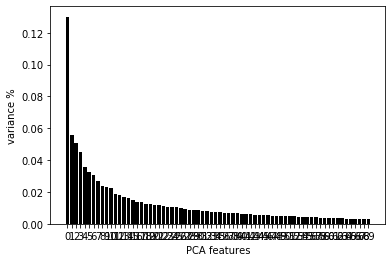

<IPython.core.display.Javascript object>

In [11]:
# Plot the explained variances
features = range(pca.n_components_)
print(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color="black")
plt.xlabel("PCA features")
plt.ylabel("variance %")
plt.xticks(features)

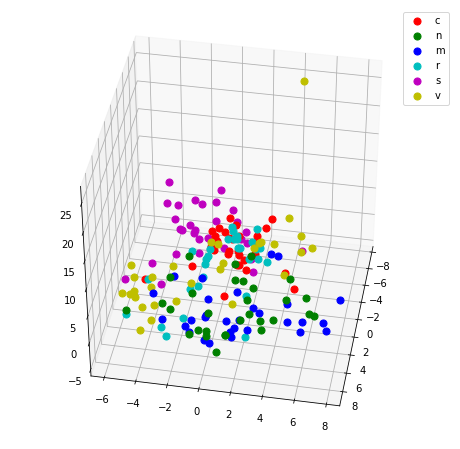

<IPython.core.display.Javascript object>

In [12]:
finalDf = pd.concat([principalDf, df[["Letra"]]], axis=1)

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

fig = plt.figure(figsize=(8, 8))
ax = fig.add_subplot(111, projection="3d")

targets = ["c", "n", "m", "r", "s", "v"]
colors = ["r", "g", "b", "c", "m", "y"]
for target, color in zip(targets, colors):
    indicesToKeep = finalDf["Letra"] == target
    ax.scatter(
        finalDf.loc[indicesToKeep, "principal component 1"],
        finalDf.loc[indicesToKeep, "principal component 2"],
        finalDf.loc[indicesToKeep, "principal component 3"],
        c=color,
        s=50,
        depthshade=False,
    )

ax.view_init(elev=40.0, azim=10)
ax.legend(targets)
ax.grid()

In [13]:
import glob
from sklearn.naive_bayes import *
from sklearn.model_selection import *

X_train, X_test, Y_train, Y_test = train_test_split(x, np.ravel(y), test_size=0.2)
clf = GaussianNB()
clf.fit(X_train, Y_train)
print("Predicted labels on test set:\n")
print(clf.predict(X_test))
print("\nAccuracy = " + str(int(clf.score(X_test, Y_test) * 100)) + "%")


# X_std = (x - np.mean(x, axis=0)) / (np.std(x, axis=0))
pca = PCA(70)
X_t = pca.fit(x)
pca2 = X_t.components_[:70, :]
trasformed2 = np.dot(x - X_t.mean_, pca2.T)
X_train, X_test, Y_train, Y_test = train_test_split(
    trasformed2, np.ravel(y), test_size=0.3
)
clf.fit(X_train, Y_train)
print(
    "Data projected onto their first two principal component\nSplitting, training and testing have been repeated"
)
print("\nPredicted label:\n")
print(clf.predict(X_test))
print("\nAccuracy = " + str(int(clf.score(X_test, Y_test) * 100)) + "%")


pca34 = X_t.components_[:287, :]
trasformed34 = np.dot(x - X_t.mean_, pca34.T)
X_train, X_test, Y_train, Y_test = train_test_split(
    trasformed34, np.ravel(y), test_size=0.3
)
clf.fit(X_train, Y_train)
print(
    "Data projected onto their third and fourth principal component\nSplitting, training and testing have been repeated"
)
print("\nPredicted label:\n")
print(clf.predict(X_test))
print("\nAccuracy = " + str(int(clf.score(X_test, Y_test) * 100)) + "%")

Predicted labels on test set:

['s' 'v' 'v' 'r' 's' 'r' 's' 'n' 's' 'r' 'c' 'v' 'n' 'c' 'r' 'n' 's' 'r'
 'n' 'v' 'r' 'm' 'c' 'r' 's' 'm' 'r' 's' 'n' 'm' 'v' 'c' 'r' 'c' 'r' 'v']

Accuracy = 72%
Data projected onto their first two principal component
Splitting, training and testing have been repeated

Predicted label:

['c' 'r' 'n' 'c' 'm' 's' 's' 'm' 's' 'm' 'v' 'm' 's' 'c' 's' 'r' 'c' 'r'
 'c' 'r' 'n' 'm' 's' 'v' 'm' 'c' 'r' 'r' 's' 's' 'c' 'n' 'r' 'v' 'v' 'c'
 'r' 'r' 'm' 'n' 'v' 'm' 'c' 'c' 's' 'c' 'n' 'r' 'v' 'n' 'n' 'v' 'v' 'r']

Accuracy = 61%
Data projected onto their third and fourth principal component
Splitting, training and testing have been repeated

Predicted label:

['r' 'r' 'v' 'v' 'v' 'c' 'm' 'r' 'c' 'n' 'v' 'n' 'r' 'n' 'c' 'v' 'm' 's'
 'r' 'r' 'c' 'n' 'r' 'r' 'n' 'n' 's' 's' 'v' 'n' 'r' 'c' 'r' 'r' 'c' 'm'
 'c' 'r' 's' 'c' 'n' 'c' 's' 'r' 'r' 'v' 's' 'c' 'r' 'n' 's' 'v' 'v' 's']

Accuracy = 64%


<IPython.core.display.Javascript object>

In [14]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

X_train, X_test, y_train, y_test = train_test_split(x, np.ravel(y), random_state=0)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

n_neighbors = 7

knn = KNeighborsClassifier(n_neighbors)
knn.fit(X_train, y_train)
print(
    "Accuracy of K-NN classifier on training set: {:.2f}".format(
        knn.score(X_train, y_train)
    )
)
print(
    "Accuracy of K-NN classifier on test set: {:.2f}".format(knn.score(X_test, y_test))
)

pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))
1
2
3

pred = knn.predict(X_test)
print(confusion_matrix(y_test, pred))
print(classification_report(y_test, pred))

Accuracy of K-NN classifier on training set: 0.86
Accuracy of K-NN classifier on test set: 0.80
[[6 0 0 1 0 0]
 [0 6 0 0 0 0]
 [0 4 4 0 0 0]
 [0 0 0 7 0 0]
 [0 1 0 1 5 0]
 [0 1 0 1 0 8]]
              precision    recall  f1-score   support

           c       1.00      0.86      0.92         7
           m       0.50      1.00      0.67         6
           n       1.00      0.50      0.67         8
           r       0.70      1.00      0.82         7
           s       1.00      0.71      0.83         7
           v       1.00      0.80      0.89        10

    accuracy                           0.80        45
   macro avg       0.87      0.81      0.80        45
weighted avg       0.89      0.80      0.81        45

[[6 0 0 1 0 0]
 [0 6 0 0 0 0]
 [0 4 4 0 0 0]
 [0 0 0 7 0 0]
 [0 1 0 1 5 0]
 [0 1 0 1 0 8]]
              precision    recall  f1-score   support

           c       1.00      0.86      0.92         7
           m       0.50      1.00      0.67         6
           n    

<IPython.core.display.Javascript object>

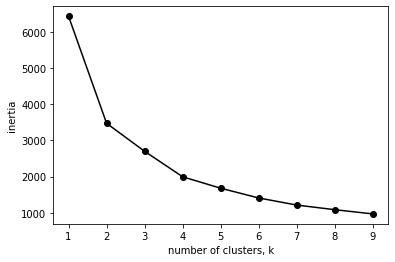

<IPython.core.display.Javascript object>

In [15]:
from sklearn.cluster import KMeans

pca = PCA(n_components=13)
principalComponents = pca.fit_transform(x)
PCA_components = pd.DataFrame(principalComponents)
ks = range(1, 10)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)

    # Fit model to samples
    model.fit(PCA_components.iloc[:, :3])

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)

plt.plot(ks, inertias, "-o", color="black")
plt.xlabel("number of clusters, k")
plt.ylabel("inertia")
plt.xticks(ks)
plt.show()

In [16]:
X_train, X_test, Y_train, Y_test = train_test_split(x, np.ravel(y), test_size=0.2)
km = KMeans(
    n_clusters=3, init="k-means++", n_init=10, max_iter=300, tol=1e-04, random_state=0
)
y_km = km.fit_predict(x)
print(
    "Accuracy of K-means classifier on training set: {:.2f}".format(
        km.score(X_train, y_train)
    )
)

Accuracy of K-means classifier on training set: -18796.31


<IPython.core.display.Javascript object>

SVM LINEAL

In [17]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(x, np.ravel(y), test_size=0.20)
from sklearn.svm import SVC

svclassifier = SVC(kernel="linear")
svclassifier.fit(X_train, y_train)
y_pred = svclassifier.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[8 0 0 0 0 0]
 [1 3 0 0 0 0]
 [0 0 6 0 0 0]
 [1 0 0 6 1 0]
 [0 0 0 1 6 0]
 [0 0 0 1 0 2]]
              precision    recall  f1-score   support

           c       0.80      1.00      0.89         8
           m       1.00      0.75      0.86         4
           n       1.00      1.00      1.00         6
           r       0.75      0.75      0.75         8
           s       0.86      0.86      0.86         7
           v       1.00      0.67      0.80         3

    accuracy                           0.86        36
   macro avg       0.90      0.84      0.86        36
weighted avg       0.87      0.86      0.86        36



<IPython.core.display.Javascript object>

SVM POLINOMIAL

In [18]:
from sklearn.svm import SVC

svclassifier = SVC(kernel="poly", degree=2)
svclassifier.fit(X_train, y_train)
y_pred = svclassifier.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[0 6 0 0 0 2]
 [0 3 0 0 0 1]
 [0 5 0 0 0 1]
 [0 2 0 0 0 6]
 [0 5 0 0 1 1]
 [0 0 0 0 0 3]]
              precision    recall  f1-score   support

           c       0.00      0.00      0.00         8
           m       0.14      0.75      0.24         4
           n       0.00      0.00      0.00         6
           r       0.00      0.00      0.00         8
           s       1.00      0.14      0.25         7
           v       0.21      1.00      0.35         3

    accuracy                           0.19        36
   macro avg       0.23      0.32      0.14        36
weighted avg       0.23      0.19      0.10        36



c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)
c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


<IPython.core.display.Javascript object>

SVM Gaussiano

In [19]:
from sklearn.svm import SVC

svclassifier = SVC(kernel="rbf")
svclassifier.fit(X_train, y_train)
y_pred = svclassifier.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[7 0 0 0 0 1]
 [1 3 0 0 0 0]
 [0 0 5 0 0 1]
 [0 0 0 8 0 0]
 [0 0 0 2 5 0]
 [0 0 0 0 0 3]]
              precision    recall  f1-score   support

           c       0.88      0.88      0.88         8
           m       1.00      0.75      0.86         4
           n       1.00      0.83      0.91         6
           r       0.80      1.00      0.89         8
           s       1.00      0.71      0.83         7
           v       0.60      1.00      0.75         3

    accuracy                           0.86        36
   macro avg       0.88      0.86      0.85        36
weighted avg       0.89      0.86      0.86        36



c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


<IPython.core.display.Javascript object>

SVM Sigmoide

In [20]:
from sklearn.svm import SVC

svclassifier = SVC(kernel="sigmoid")
svclassifier.fit(X_train, y_train)
y_pred = svclassifier.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[7 0 0 0 0 1]
 [0 3 0 1 0 0]
 [0 0 5 0 0 1]
 [0 0 0 8 0 0]
 [0 0 0 2 5 0]
 [0 0 0 1 0 2]]
              precision    recall  f1-score   support

           c       1.00      0.88      0.93         8
           m       1.00      0.75      0.86         4
           n       1.00      0.83      0.91         6
           r       0.67      1.00      0.80         8
           s       1.00      0.71      0.83         7
           v       0.50      0.67      0.57         3

    accuracy                           0.83        36
   macro avg       0.86      0.81      0.82        36
weighted avg       0.88      0.83      0.84        36



c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


<IPython.core.display.Javascript object>

c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Iteration 1, loss = 1.80774538
Iteration 2, loss = 1.76033435
Iteration 3, loss = 1.71332793
Iteration 4, loss = 1.66681992
Iteration 5, loss = 1.61533587
Iteration 6, loss = 1.55521030
Iteration 7, loss = 1.48702526
Iteration 8, loss = 1.41364900
Iteration 9, loss = 1.33759387
Iteration 10, loss = 1.26010494
Iteration 11, loss = 1.18171371
Iteration 12, loss = 1.10299934
Iteration 13, loss = 1.02485251
Iteration 14, loss = 0.94831307
Iteration 15, loss = 0.87432192
Iteration 16, loss = 0.80359113
Iteration 17, loss = 0.73660321
Iteration 18, loss = 0.67366556
Iteration 19, loss = 0.61495793
Iteration 20, loss = 0.56055468
Training set score: 0.937500
Test set score: 0.916667


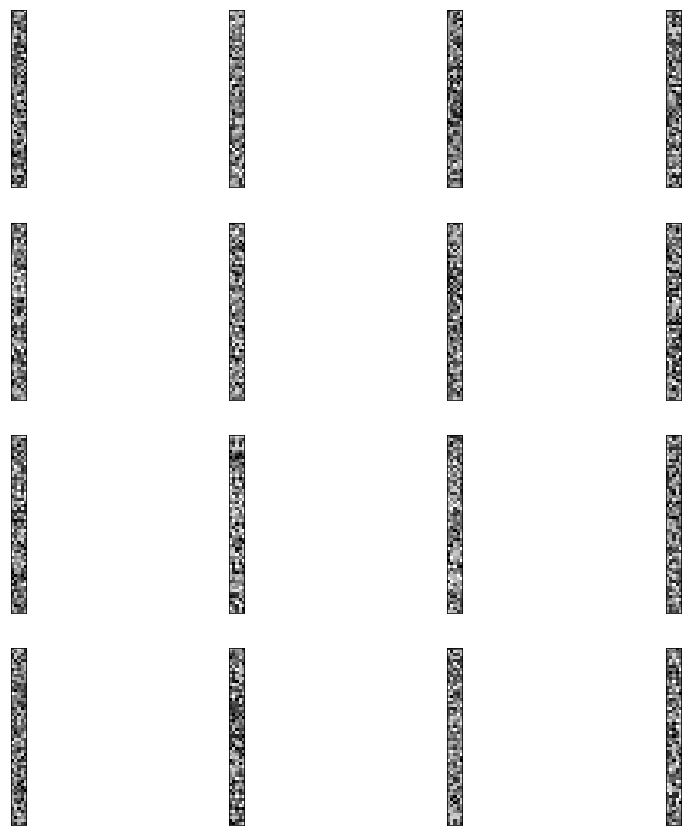

<IPython.core.display.Javascript object>

In [61]:
from matplotlib.colors import ListedColormap
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(
    hidden_layer_sizes=(50,),
    max_iter=20,
    alpha=1e-4,
    activation="logistic",
    solver="sgd",
    verbose=10,
    random_state=1,
    learning_rate_init=0.1,
)

x = StandardScaler().fit_transform(x)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
mlp.fit(X_train, y_train)
print("Training set score: %f" % mlp.score(X_train, y_train))
print("Test set score: %f" % mlp.score(X_test, y_test))

fig, axes = plt.subplots(4, 4, figsize=(15, 15))
# use global min / max to ensure all weights are shown on the same scale
vmin, vmax = mlp.coefs_[0].min(), mlp.coefs_[0].max()
for coef, ax in zip(mlp.coefs_[0].T, axes.ravel()):
    ax.matshow(coef.reshape(59, 5), cmap=plt.cm.gray, vmin=0.5 * vmin, vmax=0.5 * vmax)
    ax.set_xticks(())
    ax.set_yticks(())

plt.show()

c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Iteration 1, loss = 2.00689144
Iteration 2, loss = 1.57895051
Iteration 3, loss = 1.26415744
Iteration 4, loss = 0.98986167
Iteration 5, loss = 0.73888488
Iteration 6, loss = 0.51977156
Iteration 7, loss = 0.35612987
Iteration 8, loss = 0.24169667
Iteration 9, loss = 0.16318651
Iteration 10, loss = 0.11085463
Iteration 11, loss = 0.07614866
Iteration 12, loss = 0.05296936
Iteration 13, loss = 0.03690245
Iteration 14, loss = 0.02559560
Iteration 15, loss = 0.01761033
Iteration 16, loss = 0.01206463
Iteration 17, loss = 0.00836322
Iteration 18, loss = 0.00582656
Iteration 19, loss = 0.00408947
Iteration 20, loss = 0.00292163
Training set score: 1.000000
Test set score: 0.944444


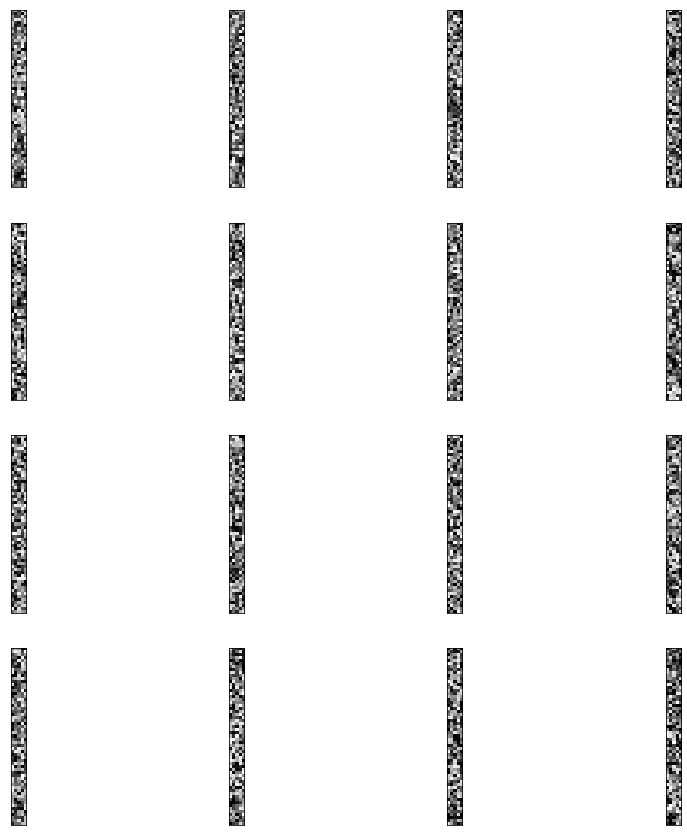

<IPython.core.display.Javascript object>

In [65]:
mlp = MLPClassifier(
    hidden_layer_sizes=(100, 100),
    max_iter=20,
    alpha=1e-4,
    activation="relu",
    solver="sgd",
    verbose=10,
    random_state=0,
    learning_rate_init=0.1,
)

x = StandardScaler().fit_transform(x)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
mlp.fit(X_train, y_train)
print("Training set score: %f" % mlp.score(X_train, y_train))
print("Test set score: %f" % mlp.score(X_test, y_test))

fig, axes = plt.subplots(4, 4, figsize=(15, 15))
# use global min / max to ensure all weights are shown on the same scale
vmin, vmax = mlp.coefs_[0].min(), mlp.coefs_[0].max()
for coef, ax in zip(mlp.coefs_[0].T, axes.ravel()):
    ax.matshow(coef.reshape(59, 5), cmap=plt.cm.gray, vmin=0.5 * vmin, vmax=0.5 * vmax)
    ax.set_xticks(())
    ax.set_yticks(())

plt.show()

c:\users\louis\appdata\local\programs\python\python37\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:921: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training set score: 1.000000
Test set score: 0.944444


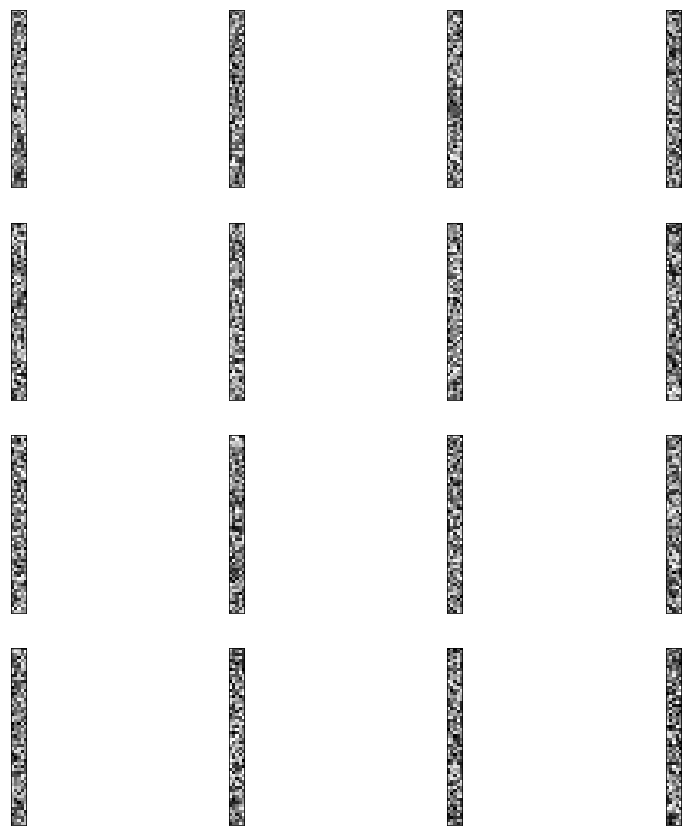

<IPython.core.display.Javascript object>

In [87]:
mlp = MLPClassifier(
    hidden_layer_sizes=(100, 100),
    max_iter=20,
    alpha=1e-4,
    activation="relu",
    solver="lbfgs",
    verbose=10,
    random_state=0,
    learning_rate_init=0.1,
)

x = StandardScaler().fit_transform(x)
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
mlp.fit(X_train, y_train)
print("Training set score: %f" % mlp.score(X_train, y_train))
print("Test set score: %f" % mlp.score(X_test, y_test))

fig, axes = plt.subplots(4, 4, figsize=(15, 15))
# use global min / max to ensure all weights are shown on the same scale
vmin, vmax = mlp.coefs_[0].min(), mlp.coefs_[0].max()
for coef, ax in zip(mlp.coefs_[0].T, axes.ravel()):
    ax.matshow(coef.reshape(59, 5), cmap=plt.cm.gray, vmin=0.5 * vmin, vmax=0.5 * vmax)
    ax.set_xticks(())
    ax.set_yticks(())

plt.show()